# Resistive Switch : Distribution plots

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import colors
from scipy import signal

In [2]:
# Make the plots a bit bigger to see
# NOTE: Must be done in a separate cell
plt.rcParams['figure.dpi'] = 100

In [3]:
# path = "Data/run17_v/"
# path1 = "Data_ccr/par_set_2_psd/vrun4_d2_40/"
# path1 = "Data_ccr/par_set_2_psd/trun2_d1/"
path1 = "../NoneqTrans2/Data_test/par_set1/vrun1_d1_85/"
# path1 = "../NoneqTrans2/Data_test/80x80/vrun2_d1_40/"
# path1 = "../../../../../../Volumes/Kunal_EHD/Work/Codes/RS_data_122920/par_set_2_cbc/80x80/vrun2_d1_85/"
# path2 = "../NoneqTrans2/Data_test/vrun2_d1_40/"
# Python Data Single run
A1 = np.loadtxt(path1 + "delta_f2py_test.dat")
nn1 = np.size(A1,0)
print(np.shape(A1))

#### Python Data Voltage Up
E_up = A1[:,0]
# T_up = A1[:,0]
delta_up = A1[:,1]
I_up = A1[:,6]
Vs_up = A1[:,4]
R_up = A1[:,7]
# dR_up = A1[:,9]
mx = 64
my = 64
nummax = 128
inputs = open(path1+"input_par.dat", "r")

print(inputs.read())

(180, 11)
{'mx': 64, 'my': 64, 'nwarm': 400000, 'nskip': 16, 'Tc': 1.0, 'coef': 0.1, 'dphi': 0.2, 'gamma': 0.1, 'r0': 3.5, 'g2': 1.0, 'g4': -1.0, 'g6': 0.5, 'Rload': 1.0, 'mfphi': False, 'tloop': False}{'Tcrit': 1.32, 'dE': 0.1, 'minE': 0.1, 'maxE': 18.1, 'dTb': 0.01, 'minT': 0.01, 'maxT': 2.01, 'nmeas': 2048, 'Tbath': 0.85, 'seed': 37525891, 'NPEs': 1, 'iphi': True}


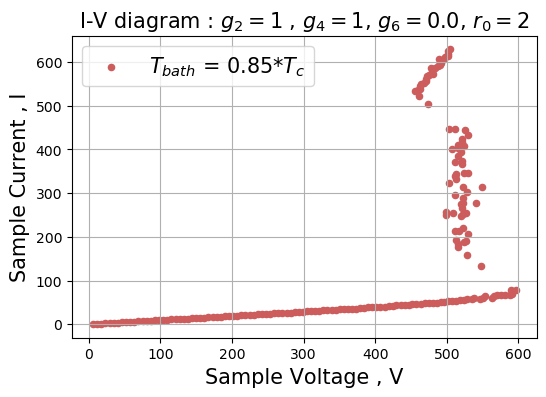

In [4]:
plt.scatter(Vs_up, I_up, s = 20.0, c = 'IndianRed', label='$T_{bath}$ = 0.85*$T_c$' , marker = 'o')
# plt.plot(Vs_up, I_up,  c = 'IndianRed')


# plt.plot(Data_Set[:,0],Data_Set[:,1])
plt.legend(fontsize = 15)
plt.title('I-V diagram : $g_2 = 1$ , $g_4 = 1$, $g_6 = 0.0$, $r_0 = 2.$' , fontsize = 15)
# plt.title('I-V diagram , $n_{skip}$=32, $E$ = 0.1')
plt.xlabel('Sample Voltage , V', fontsize = 15 )
plt.ylabel('Sample Current , I', fontsize = 15 )
# plt.xlim(14.0,22.)
plt.grid(b=True,which='major', axis='both')
# plt.savefig("I-V_comparison.pdf")

plt.show()

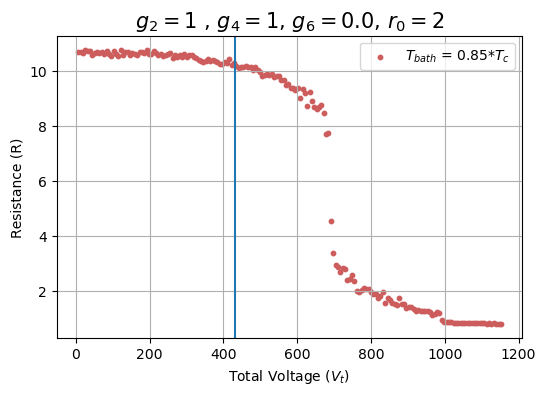

In [5]:
plt.scatter(E_up*my,R_up, s=10.0,c="IndianRed",label="$T_{bath}$ = 0.85*$T_c$")
# plt.scatter(T_up,delta_up, s=10.0,c="IndianRed",label="Temp upsweep")

# plt.axvline(x=1.32)
plt.axvline(x = 432.)
plt.xlabel('Total Voltage ($V_t$)')
# plt.xlabel('Bath Temperature (T)')
plt.ylabel('Resistance (R)')
# plt.xlim(18.,30.)
plt.title('$g_2 = 1$ , $g_4 = 1$, $g_6 = 0.0$, $r_0 = 2.$' , fontsize = 15)
plt.grid(b=True,which='major', axis='both')
plt.legend()

# plt.savefig("Resitance_v_Field.pdf")
plt.show()

In [6]:
# #### Temperature Domain plots
# rows = 32
# columns = 4
# fig=plt.figure(figsize=(40, 320))
# T = 1.29
# for i in range(128):
# #     if i%16 == 0:  
#     globals()["phi_" + str(i)] = np.loadtxt(path1 + "phi_val_"+ format(T, '.2f')+ "_" +str(i)+".dat")
#     fig.add_subplot(rows, columns, (i+1))
#     plt.imshow(np.transpose(globals()["phi_" + str(i)]),cmap='rainbow')
#     plt.title("T = "+format(T, '.2f'), fontsize = 80)
# #     plt.xlabel("m_x")
# #     plt.ylabel("m_y")
# # plt.legend()    

# plt.show()




In [7]:
#### Voltage Domain plots

mxphi = []
mnphi = []

mxdphi = []
mndphi = []
for i in range(nn):
    phi = np.loadtxt(path1 + "phi_val_"+ format(E_up[i], '.2f')+ "_"+ str(Nsamp-1)+ "_.dat")
    dphi = phi - np.mean(phi)
    mxphi.append(np.max(phi))
    mnphi.append(np.min(phi))
    mxdphi.append(np.max(dphi))
    mndphi.append(np.min(dphi))


maxphi = np.max(mxphi)
minphi = np.min(mnphi)
maxdphi = np.max(mxdphi)
mindphi = np.min(mndphi)
print( minphi, maxphi)
print(mindphi, maxdphi)

-2.0 2.0


In [8]:
#### Voltage Domain plots
rows = 18
columns = 10
fig, axes = plt.subplots(figsize=(100, 180))
# fig.suptitle = "$\phi$ distribution, $T_B = 0.4T_C$"
E = 4.6
width1 = np.zeros(rows*columns)
for i in range(rows*columns):
    globals()["phi_" + str(i)] = np.loadtxt(path1 + "phi_val_"+ format(E_up[i], '.2f')+ "_"+ str(nummax-1)+ "_.dat")
#     globals()["phi_" + str(i)] = np.loadtxt(path1 + "phi_val_"+ format(T_up[i], '.2f')+ "_"+ str(127)+ "_.dat")
    fig.add_subplot(rows, columns, (i+1))
    dist = plt.imshow(np.transpose((globals()["phi_" + str(i)])),cmap='plasma',origin='lower', vmin = minphi, vmax = maxphi)
    x, y = np.meshgrid(np.arange(mx), np.arange(my))
#     plt.contourf(x,y,np.transpose((globals()["phi_" + str(i)])), cmap='rainbow', vmin = -0.8, vmax = 1.5)
#     plt.colorbar(dist)
    plt.title("Vt = "+format(E_up[i], '.2f'), fontsize = 80 )
#     plt.title("T = "+format(T_up[i], '.2f'), fontsize = 80 )
    E += 0.1
    plt.xlabel("m_x")
    plt.ylabel("m_y")
# plt.legend()
# plt.title('$N_{meas}$=1024, $g_2 = 1$ , $g_4 = -1$, $g_6 = 0.5$, $r_0 = 3.5$')
# fig.colorbar(dist)
# plt.savefig(path1 + "Dist_phi2_Tbath=0.60*Tc2.pdf")
# print(width)
plt.show()




In [9]:
#### Voltage Domain plots : Temporal Snapshots 
rows = 16
columns = 8
fig=plt.figure(figsize=(80, 160))
tt = 128
# E = 0.56
E = 11.6

# fluc1 = np.zeros(tt)
for t in range(tt):
#     if i%16 == 0:    
    globals()["phi_" + str(t)] = np.loadtxt(path1 + "phi_val_"+ format(E, '.2f')+ "_" +str(t)+"_.dat")
#     phi = np.loadtxt(path1 + "phi_val_"+ format(E, '.2f')+ "_" +str(t)+"_.dat")
#     phi2 = phi - np.mean(phi)
    fig.add_subplot(rows, columns, (t+1))
    dist = plt.imshow(np.transpose((globals()["phi_" + str(t)])),cmap='plasma',origin='lower', vmin = minphi, vmax = maxphi)
    x, y = np.meshgrid(np.arange(mx), np.arange(my))
#     plt.imshow(np.transpose(phi2),cmap='rainbow')
    plt.title("E = "+format(E, '.2f'), fontsize = 60 )
#     fluc1[i] = np.var(np.transpose((globals()["phi_" + str(i)])**2))
#     plt.xlabel("m_x")
#     plt.ylabel("m_y")
# plt.legend()

# plt.savefig(path2 + "Dist_time_Tbath=0.85Tc_E=23.10.pdf")

plt.show()



In [10]:
# #### Voltage Domain plots : Temporal Snapshots 
# rows = 8
# columns = 8
# fig=plt.figure(figsize=(80, 80))
# tt = 64
# E = 21.9
# fluc2 = np.zeros(tt)
# for i in range(tt):
# #     if i%16 == 0:    
#     globals()["phi_" + str(i)] = np.loadtxt(path1 + "phi_val_"+ format(E, '.2f')+ "_" +str(i*16)+".dat")
#     fig.add_subplot(rows, columns, (i+1))
#     plt.imshow(np.transpose((globals()["phi_" + str(i)])**2),cmap='rainbow')
#     plt.title("E = "+format(E, '.2f'), fontsize = 60 )
#     fluc2[i] = np.var(np.transpose((globals()["phi_" + str(i)])**2))
# #     plt.xlabel("m_x")
# #     plt.ylabel("m_y")
# # plt.legend()

# # plt.savefig(path2 + "Dist_time_Tbath=0.85Tc_E=23.10.pdf")

# plt.show()




In [11]:
# #### Voltage Domain plots : Temporal Snapshots 
# rows = 8
# columns = 8
# fig=plt.figure(figsize=(80, 80))
# tt = 64
# E = 21.95
# fluc3 = np.zeros(tt)
# for i in range(tt):
# #     if i%16 == 0:    
#     globals()["phi_" + str(i)] = np.loadtxt(path1 + "phi_val_"+ format(E, '.2f')+ "_" +str(i*16)+".dat")
#     fig.add_subplot(rows, columns, (i+1))
#     plt.imshow(np.transpose((globals()["phi_" + str(i)])**2),cmap='rainbow')
#     plt.title("E = "+format(E, '.2f'), fontsize = 60 )
#     fluc3[i] = np.var(np.transpose((globals()["phi_" + str(i)])**2))
# #     plt.xlabel("m_x")
# #     plt.ylabel("m_y")
# # plt.legend()

# # plt.savefig(path2 + "Dist_time_Tbath=0.85Tc_E=23.10.pdf")

# plt.show()




In [12]:
# #### Voltage Domain plots : Temporal Snapshots 
# rows = 8
# columns = 8
# fig=plt.figure(figsize=(80, 80))
# tt = 64
# E = 22.0
# fluc4 = np.zeros(tt)
# for i in range(tt):
# #     if i%16 == 0:    
#     globals()["phi_" + str(i)] = np.loadtxt(path1 + "phi_val_"+ format(E, '.2f')+ "_" +str(i*16)+".dat")
#     fig.add_subplot(rows, columns, (i+1))
#     plt.imshow(np.transpose((globals()["phi_" + str(i)])**2),cmap='rainbow')
#     plt.title("E = "+format(E, '.2f'), fontsize = 60 )
#     fluc4[i] = np.var(np.transpose((globals()["phi_" + str(i)])**2))
# #     plt.xlabel("m_x")
# #     plt.ylabel("m_y")
# # plt.legend()

# # plt.savefig(path2 + "Dist_time_Tbath=0.85Tc_E=23.10.pdf")

# plt.show()





In [13]:
# # print(fluc1)
# fluc = np.concatenate((fluc1, fluc2, fluc3, fluc4))

# plt.plot(fluc1)
# plt.plot(fluc2)
# plt.plot(fluc3)
# plt.plot(fluc4)
# plt.show()

In [14]:
# Tdata = []
# # PSD = []
# # Omega = []
# fs = 1000.0
# for i in range(nn1):
#     tdata = np.loadtxt(path1 + "t_data_" + str(i) + ".dat")
#     R0 = np.mean(tdata)
#     delR = tdata - R0*np.ones(np.size(tdata))
# #     fval, R_ps = signal.welch(delR/R0,fs)
#     Tdata.append(tdata)
# #     PSD.append(R_ps)
# #     Omega.append(fval)
#     if i == :
# #         plt.plot(12*delR/R0 , label = "E = " + format(E_up[i], '.2f') )
#         plt.plot(tdata, label = "E = " + format(E_up[i], '.2f') )
#     elif i == 222:
# #         plt.plot(delR/R0 , label = "E = " + format(E_up[i], '.2f') )
#         plt.plot(tdata, label = "E = " + format(E_up[i], '.2f') )
#     elif i == 239:
# #         plt.plot(delR/R0 , label = "E = " + format(E_up[i], '.2f') )
#         plt.plot(tdata, label = "E = " + format(E_up[i], '.2f') )
#     elif i == 236:
# #         plt.plot(delR/R0 , label = "E = " + format(E_up[i], '.2f') )
#         plt.plot(tdata, label = "E = " + format(E_up[i], '.2f') )
#     elif i == 240:
# #         plt.plot(delR/R0 , label = "E = " + format(E_up[i], '.2f') )
#         plt.plot(tdata, label = "E = " + format(E_up[i], '.2f') )
#     else:
#         None
        

    
# Tdata = np.array(Tdata)
# # PSD = np.array(PSD)
# # Omega = np.array(Omega)
# # print(np.shape(Tdata) , np.shape(PSD) , np.shape(Omega))
# plt.xlabel("time")
# plt.ylabel("$\Delta R$/$R_0$")
# plt.ylabel("R")
# # # plt.ylim(0,10)
# plt.legend()
# # plt.title("$\Delta R$/$R_0$ vs t, $N_{meas} = 1024$ , $m_x = m_y = 64$  ")
# plt.title("R vs t, $N_{meas} = 1024$ , $m_x = m_y = 64$  ")
# plt.savefig(path1 +"Rvt.pdf")
# plt.show()